### Overview:


Dataset provider keeps the dataset confidential. Because of that there is no clear definition for features. However, there are some hints in the name of the features as follow: 
- **"Ind"** is related to individual or driver,
- **"reg"** is related to region,
- **"car"** is related to car
- **"calc"** is an calculated feature.

<br>The features and rows are not time dependent.
<br>The "reg" column represents qualities of regions on continuous/ordinal scale.
<br>Each row is a client, they are independent. The ID was assigned randomly.
<br>All the records are from same period of time.

<br> Suppose that Y is the target feature, then:
- Y=1 means "claim"
- Y=0 means "no claim".

<br>The goal of the Gini scoring system is to order the participants from less probable to more probable of filing an insurance claim. Therefore, the goal is the prediction of Probability(Y=1) for submission.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn import metrics
import re
import time
from scipy import stats

import warnings
warnings.filterwarnings("ignore")

#Quality of image:
%config InlineBackend.figure_format = 'svg'
import os


from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import VarianceThreshold


pd.set_option('display.max_columns', 100)

# Import my own functions from utils file:
import import_ipynb
from Utils_Car_Insurance import *

importing Jupyter notebook from Utils_Car_Insurance.ipynb


#### Reading Files:

In [2]:
dataDirectory = os.path.join(os.path.dirname(os.getcwd()),'Car_Insurance\\data')
imageDirectory = os.path.join(os.path.dirname(os.getcwd()),'Car_Insurance\\images\\EDA')

In [3]:
train_df = pd.read_csv(dataDirectory + "\\train_car_insurance_Tohid.csv")
test_df = pd.read_csv(dataDirectory + "\\test_car_insurance_Tohid.csv")

In [4]:
train_df.columns

Index(['id', 'target', 'd_01', 'd_02_cat', 'd_03', 'd_04_cat', 'd_05_cat',
       'd_06_bin', 'd_07_bin', 'd_08_bin', 'd_09_bin', 'd_10_bin', 'd_11_bin',
       'd_12_bin', 'd_13_bin', 'd_14', 'd_15', 'd_16_bin', 'd_17_bin',
       'd_18_bin', 'r_01', 'r_02', 'r_03', 'c_01_cat', 'c_02_cat', 'c_04_cat',
       'c_06_cat', 'c_07_cat', 'c_08_cat', 'c_09_cat', 'c_10_cat', 'c_11_cat',
       'c_11', 'c_12', 'c_13', 'c_14', 'c_15', 'has_missing'],
      dtype='object')

#### Distribution of the target variable:

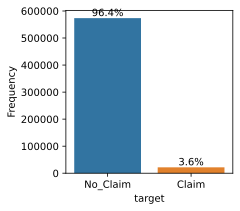

In [5]:
make_count_plot(df=train_df, cols=['target'], annotate=True, xRotation = 0, title=None, width=3, height=3)
plt.savefig(imageDirectory + '\\target_dist.png', dpi=140,  bbox_inches='tight')

#### Insights:
- The dataset is strongly imbalanced,
- We can apply sampling technique, such as oversampling and undersampling,
- We should take care of error type1 and error type 2.

#### Imbalanced dataset vs Accuracy:
Of course, the score is not a good indicator to investigate the goodness of model.

In [6]:
X = train_df.drop(['id','target'], axis=1).values
y = train_df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15, stratify=y, random_state=123)
    
# We will check a dummy model that always returns majority class; in this example: target=No_Claim
from sklearn.dummy import DummyClassifier
model = DummyClassifier(strategy = 'most_frequent').fit(X_train, y_train)
model.score(X_test, y_test)

0.9635536838332475

#### What type of features we have?

In [7]:
train_df.dtypes.value_counts()

int64      30
float64     7
object      1
dtype: int64

#### Features Types
- All data are in form of digits.
- Features in form of float will be numerical features.
- Features in form of int can be Categorical, Ordinal or Binary

### Making a dataframe for metadata:

In [8]:
def make_metadata(df):
    data = []
    for feature in df.columns:
        # Defining the role
        if feature == 'target':
            role = 'target'
        elif feature == 'id':
            role = 'id'
        else:
            role = 'input'

        # Defining the type
        if 'bin' in feature or feature == 'target':
            type = 'binary'
        elif 'cat' in feature or feature == 'id':
            type = 'categorical'
        elif (df[feature].dtype == 'float32') | (df[feature].dtype == 'float64'):
            type = 'numeric'
        else:
            type = 'ordinal'

        # Initialize preserve to True for all variables except for id
        preserve = True
        if feature == 'id':
            preserve = False

        # Defining the data type 
        dtype = df[feature].dtype

        category = 'none'
        # Defining the category
        if 'd_' in feature:
            category = 'driver'
        elif 'r_' in feature:
            category = 'region'
        elif 'c_' in feature:
            category = 'car'
        elif 'a_' in feature:
            category = 'artificial'

        uniqueCnt = df[feature].nunique()


        # Creating a dictionary for adding a row to metadata:
        feature_dictionary = {
            'varname': feature,
            'role': role,
            'type': type,
            'preserve': preserve,
            'dtype': dtype,
            'category' : category,
            'uniqueCnt': uniqueCnt
        }
        data.append(feature_dictionary)

    metadata = pd.DataFrame(data, columns=['varname', 'role', 'type', 'preserve', 'dtype', 'category', 'uniqueCnt'])
    metadata.set_index('varname', inplace=True)
    return metadata

In [9]:
metadata = make_metadata(train_df)
metadata.head()

,role,type,preserve,dtype,category,uniqueCnt
varname,,,,,,
id,id,categorical,False,int64,none,595212
target,target,binary,True,object,none,2
d_01,input,ordinal,True,int64,driver,8
d_02_cat,input,categorical,True,int64,driver,5
d_03,input,ordinal,True,int64,driver,12


### Question: 
- How many features belong to **different category**?

In [10]:
catFeatures, catCnt, cat_df = make_typedf(train_df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(train_df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(train_df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(train_df, metadata, 'binary')

In [11]:
cat_df.head(5)

,feature,uniqueCnt
0,d_02_cat,5
1,d_04_cat,3
2,d_05_cat,8
3,c_01_cat,13
4,c_02_cat,3


### Question: 
- How many features do we have for each **role and type**?

In [12]:
pd.DataFrame({'count' : metadata.groupby(['role', 'type'])['role'].size()}).reset_index()

,role,type,count
0,id,categorical,1
1,input,binary,11
2,input,categorical,12
3,input,numeric,7
4,input,ordinal,6
5,target,binary,1


In [13]:
train_df[numFeatures].describe()

,r_01,r_02,r_03,c_12,c_13,c_14,c_15
count,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000
mean,0.610991,0.439184,0.864904,0.379947,0.813265,0.375046,3.065899
std,0.287643,0.404264,0.322381,0.058300,0.224588,0.044761,0.731366
min,0.000000,0.000000,0.061237,0.100000,0.250619,0.109545,0.000000
25%,0.400000,0.200000,0.644205,0.316228,0.670867,0.350428,2.828427
50%,0.700000,0.300000,0.765261,0.374166,0.765811,0.374433,3.316625
75%,0.900000,0.600000,1.009950,0.400000,0.906190,0.397492,3.605551
max,0.900000,1.800000,4.037945,1.264911,3.720626,0.636396,3.741657


In [14]:
car_df = make_categorydf(train_df, metadata, 'car')
driver_df = make_categorydf(train_df, metadata, 'driver')
region_df = make_categorydf(train_df, metadata, 'region')
car_df.head(5)

,feature,uniqueCnt
0,c_01_cat,13
1,c_02_cat,3
2,c_04_cat,10
3,c_06_cat,18
4,c_07_cat,3


### Variables' range:
- What is the range of different variables?
- To answer, we will check the ordinal and numerical variables' range.

In [15]:
# First we have to choose the numerical features (ordinal and numeric):
feat_lst = metadata.loc[(metadata['type'] == 'ordinal') | (metadata['type'] == 'numeric'), ['type', 'category']]#.groupby('category')
feat_lst = feat_lst.groupby('category')

feat_driver = feat_lst.get_group('driver')
feat_driver['range'] = train_df[feat_driver.index].max() - train_df[feat_driver.index].min()

feat_car = feat_lst.get_group('car')
feat_car['range'] = train_df[feat_car.index].max() - train_df[feat_car.index].min()

feat_region = feat_lst.get_group('region')
feat_region['range'] = train_df[feat_region.index].max() - train_df[feat_region.index].min()

In [16]:
feat_driver.head(3)

,type,category,range
varname,,,
d_01,ordinal,driver,7
d_03,ordinal,driver,11
d_14,ordinal,driver,4


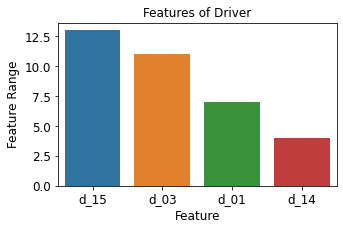

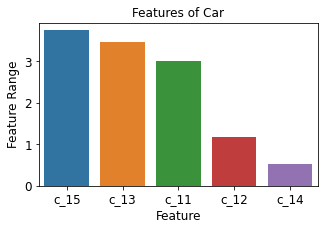

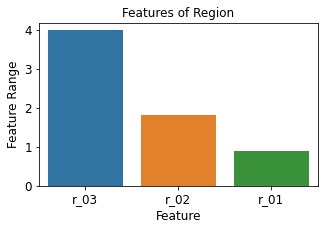

In [17]:
%config InlineBackend.figure_format = 'png'
make_bar_plot(X=feat_driver.index, y=feat_driver['range'], x_label = 'Feature', y_label='Feature Range', sort=True, title = 'Features of Driver');
make_bar_plot(X=feat_car.index, y=feat_car['range'], x_label = 'Feature', y_label='Feature Range', sort=True, title = 'Features of Car');
make_bar_plot(X=feat_region.index, y=feat_region['range'], x_label = 'Feature', y_label='Feature Range', sort=True, title = 'Features of Region');

### Cardinality of features:

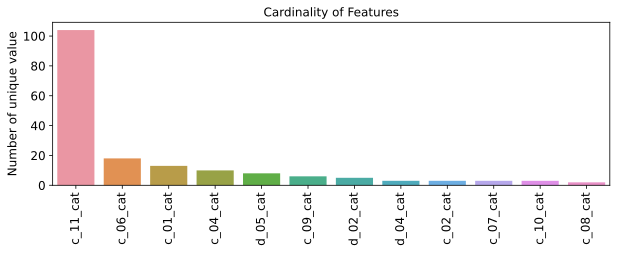

In [18]:
%config InlineBackend.figure_format = 'svg'
make_bar_plot(X=cat_df['feature'], y=cat_df['uniqueCnt'], y_label='Number of unique value', x_Rotation = 90, width=10, height=3, sort=True, title = 'Cardinality of Features')
plt.savefig(imageDirectory + '\\cardinality.png', dpi=140,  bbox_inches='tight')

### <font color='green'>Insight:</font>
- Except for feature "c_11_cat", all categorical features have less than 20 unique data entry.
- Feature "c_11_cat" has 104 unique data entry.
- For "c_11_cat" we can go with target encoding.
- For the rest of categorical features, we can go ahead with one hot encoding.

### <font color='blue'>Question:</font>
- Is there any trend between missing value and probability of making a claim?
- We have to analyze features in different categories and chance of making claim.

<Figure size 432x288 with 0 Axes>

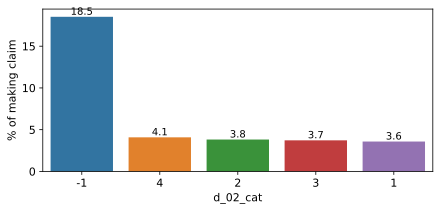

<Figure size 432x288 with 0 Axes>

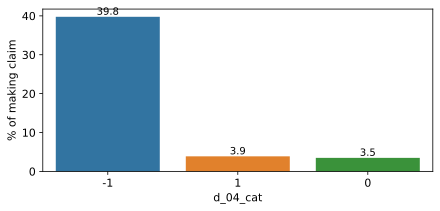

<Figure size 432x288 with 0 Axes>

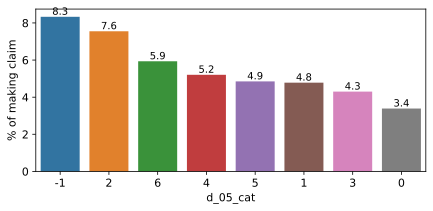

<Figure size 432x288 with 0 Axes>

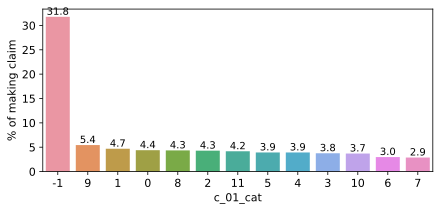

<Figure size 432x288 with 0 Axes>

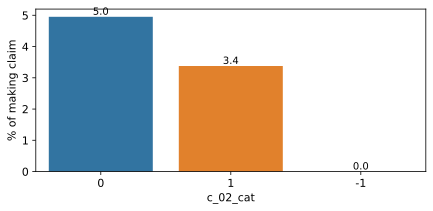

<Figure size 432x288 with 0 Axes>

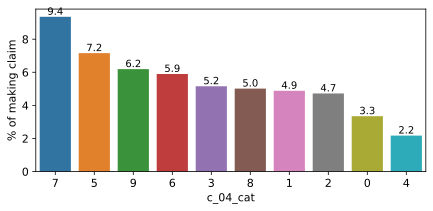

<Figure size 432x288 with 0 Axes>

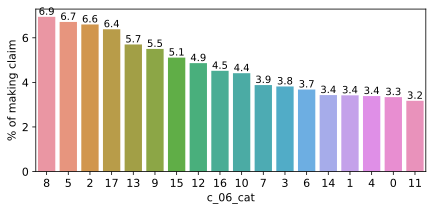

<Figure size 432x288 with 0 Axes>

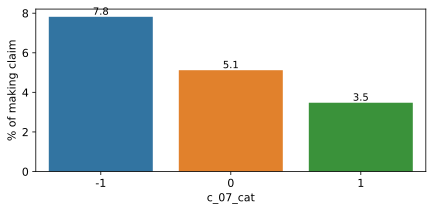

<Figure size 432x288 with 0 Axes>

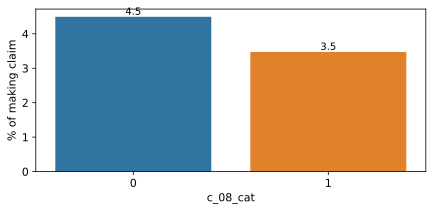

<Figure size 432x288 with 0 Axes>

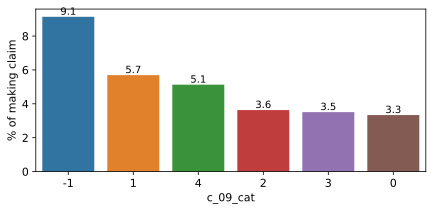

<Figure size 432x288 with 0 Axes>

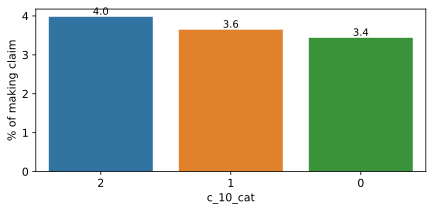

<Figure size 432x288 with 0 Axes>

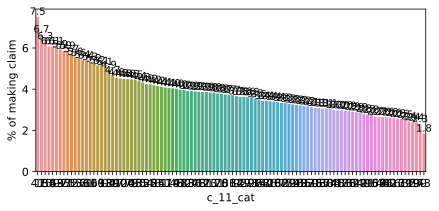

In [19]:
for feat in catFeatures:
    
    # Calculate the percentage of target=1 per category value
    cat_group = train_df[[feat, 'target']].groupby([feat],as_index=False)
    cat_group = pd.DataFrame(cat_group)
    cat_group.columns = ['level', 'info']
    cat_group['minorityRatio'] = 0
    
    for i in range(cat_group.shape[0]):
        try:
            cat_group.iloc[i,2] = cat_group.iloc[i, 1].target.value_counts(normalize=True).values[1]*100
        except:
            # means that this level does not have any input from minority group
            cat_group.iloc[i,2] = 0
    cat_group.sort_values(by='minorityRatio', ascending=False, inplace=True)    
    
    
    # Finally, we will plot:
    plt.figure()
    fig, ax = plt.subplots(figsize=(7,3))
    # Bar plot
    # Order the bars descending on target mean
    sns.barplot(ax=ax, x='level', y='minorityRatio', data=cat_group, order=cat_group['level'])
    ax.set_ylabel('% of making claim', fontsize=11)
    ax.set_xlabel(feat, fontsize=11)
    ax.tick_params(axis='both', which='major', labelsize=11)
    
    # To write the numeric values on top each bar:
    for p in ax.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        ax.annotate('{:.1f}'.format(y), (x.mean(), y), ha='center', va='bottom')
    
    plt.savefig(imageDirectory + '\\missing_' + feat + '.png', dpi=140,  bbox_inches='tight')

### Insight:
- It is quite interesting that categorical features with missing value can be divided into two subgroups:
<br>
- Features where their Missing Values are along with **maximum chance of making claim**.
    - d_02_cat,
    - d_04_cat,
    - d_05_cat,
    - c_01_cat,
    - c_07_cat,
    - c_09_cat
<br>
- Features where their Missing Values are along with **minimum chance of making claim**.    
    - c_03_cat
    - c_05_cat
    
- According to this observation, it is quite logical to **keep missing values** in categorical feature.   

### Question:
- What is the distribution of missing values?
- According to the dataset describtion, indicator for missing records is the value of "-1"

#### Visualization of distribution of categorical features:
- the count of data entry at each level have been **normalized** before ploting.

In [20]:
crosstable = pd.crosstab(train_df['d_02_cat'], train_df['target'], normalize='index')
crosstable

target,Claim,No_Claim
d_02_cat,,
-1,0.185185,0.814815
1,0.035725,0.964275
2,0.038139,0.961861
3,0.037217,0.962783
4,0.040780,0.959220


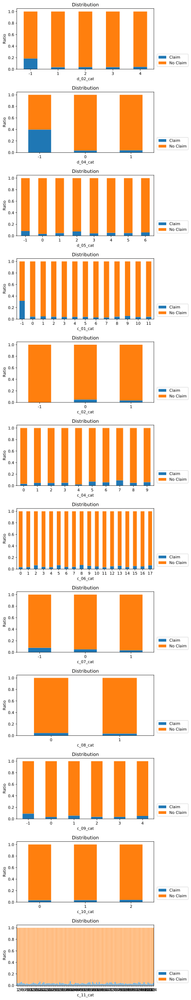

In [21]:
fig, axes = plt.subplots(catCnt,1,figsize=(7,catCnt*3))

for i,subplot in zip(range(catCnt), axes.flatten()):
    
    crosstable = pd.crosstab(train_df[catFeatures[i]], train_df['target'], normalize='index')    
    crosstable.plot(kind='bar', stacked=True, ax=subplot)
    
    subplot.set_title('Distribution')
    subplot.set_xlabel(catFeatures[i], size = 10)
    subplot.set_ylabel('Ratio', size = 10)
    subplot.tick_params(axis='x', labelrotation=0)
    subplot.legend(bbox_to_anchor=(1.25,0.25), loc='upper right', borderaxespad=0, labels=['Claim', 'No Claim'])
    fig.tight_layout()
plt.savefig(imageDirectory + '\\missing_stack.png', dpi=140,  bbox_inches='tight')

### Insight:
- We can see **two different behaivior** in terms of ratio of making claim in categorical variables:
<br>
- **Higher risk** of making claim when the data value is missed:
    - d_02_cat,
    - d_04_cat,
    - d_05_cat,
    - c_01_cat,
    - c_07_cat,
    - c_09_cat,    
<br>
- **Lower risk** of making claim when the data value is missed:       
    - c_02_cat
    
    
- For further analysis, it is worthful to know the ***real concept of the variables***. Especially, when the missing values are along with higher risk of claiming which are: 
    - c_07_cat, d_05_cat, c_09_cat, d_02_cat, c_01_cat, d_04_cat.

In [23]:
def visualizeMinority(df, features, cnt, targetname, barNumber=False):
    
    cols = features.copy()
    if targetname in cols:
        cols.remove(targetname)
        cnt -= 1
        
    fig, axes = plt.subplots(cnt,1,figsize=(10,cnt*3))


    for i,subplot in zip(range(cnt), axes.flatten()):

        crosstable = pd.crosstab(df[cols[i]], df[targetname], normalize='index')
        #crosstable.sort_values(by=1, ascending = False, inplace=True)

        crosstable[1].plot(kind='bar', stacked=True, ax=subplot)


        subplot.set_title('Distribution')
        subplot.set_xlabel(cols[i], size = 10)
        subplot.set_ylabel('Filing Possibility', size = 10)

        xlabel = crosstable.index
        xlabel = np.round(xlabel,3)
        subplot.set_xticklabels(xlabel, rotation='90')

        #subplot.legend()
        subplot.legend(bbox_to_anchor=(1.25,0.25), loc='upper right', borderaxespad=0, labels=['target = 0'])
        fig.tight_layout()
        
        if(barNumber == True):
            for p in subplot.patches:
                x=p.get_bbox().get_points()[:,0]
                y=p.get_bbox().get_points()[1,1]
                subplot.annotate('{:.3f}'.format(y), (x.mean(), y), ha='center', va='bottom')

    return

#####################################################################
#####################################################################
#####################################################################

def visualMinorityandFreq(df, features, cnt, targetname, barNumber=False, x_rotation=0):
    
    cols = features.copy()
    if targetname in cols:
        cols.remove(targetname)
        cnt -= 1
        
    fig, axes = plt.subplots(cnt,2,figsize=(10,cnt*3))


    #for i,subplot in zip(range(cnt), axes.flatten()):
    for i,col in enumerate(cols):
        ################################################################
        # First Graph
        crosstable = pd.crosstab(df[col], df[targetname], normalize='index')
        #crosstable.sort_values(by=1, ascending = False, inplace=True)

        crosstable['Claim'].plot(kind='bar', stacked=True, ax=axes[i][0])
        

        axes[i][0].set_title('Distribution')
        axes[i][0].set_xlabel(cols[i], size = 10)
        axes[i][0].set_ylabel('Chance of making claim', size = 10)

        xlabel = crosstable.index
        xlabel = np.round(xlabel,3)
        axes[i][0].set_xticklabels(xlabel, rotation=x_rotation)

        #subplot.legend()
        #axes[i][0].legend(bbox_to_anchor=(1.35,0.25), loc='upper right', borderaxespad=0, labels=['target = 0'])
        fig.tight_layout()
        
        if(barNumber == True):
            for p in axes[i][0].patches:
                x=p.get_bbox().get_points()[:,0]
                y=p.get_bbox().get_points()[1,1]
                axes[i][0].annotate('{:.3f}'.format(y), (x.mean(), y), ha='center', va='bottom')

                
                
                
                
        ################################################################        
        # Second Graph
        temp = train_df[col].value_counts(sort=False)
        
        ################Changing Barplot Index###################
        #### We want to reorder the index in a way to show the -1 class as the first bar.
        temp.sort_index(inplace = True)
        temp.plot(kind='bar', ax = axes[i][1])
        
        #axes[i].set_xticks(np.arange(cnt));
        #axes[i].set_xticklabels(xtickLst, rotation=90)
        axes[i][1].set_title('Distribution')
        axes[i][1].set_xlabel(col)
        axes[i][1].set_ylabel('Frequency')
        
        xlabel = temp.index
        xlabel = np.round(xlabel,3)
        axes[i][1].set_xticklabels(xlabel, rotation='90')

        if(barNumber == True):
            totalcnt = train_df.shape[0]
            for p in axes[i][1].patches:
                x=p.get_bbox().get_points()[:,0]
                y=p.get_bbox().get_points()[1,1]
                axes[i][1].annotate('{:.1f}%'.format(y*100/totalcnt), (x.mean(), y), ha='center', va='bottom')

        fig.tight_layout()
    return

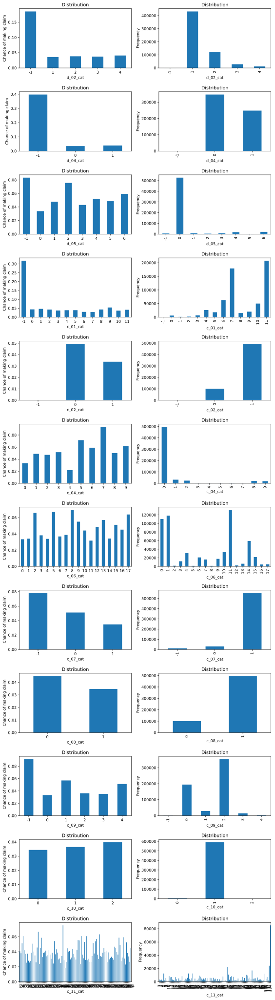

In [24]:
visualMinorityandFreq(train_df, catFeatures, catCnt, targetname='target', barNumber = False)
plt.savefig(imageDirectory + '\\categorical_dist.png', dpi=140,  bbox_inches='tight')

### <font color='green'>Insights:</font>
- Similar to the previous set of plotting, one can see two different behaivior as a function of missing values:<br>
- Ratio of claiming **is more** when the data value is missed in:
    - d_02_cat,
    - d_04_cat,
    - d_05_cat,
    - c_01_cat,
    - c_07_cat,
    - c_09_cat,    
************************    
- Ratio of claiming **is less** when the data value is missed in:       
    - c_02_cat
************************
- More details:
    - **d_02_cat**:
        - maximum frequencies: 1>2>3>4>-1
        - claiming chance: is comparable for 1,2,3,4
        - Highest claim chance is for: -1
        
    ***********************
    - **d_04_cat**:
        - maximum frequencies: 0>1>-1
        - claiming chance: is comparable for 0, 1
        - Highest claim chance is for: -1
        
    ***********************        
    - **d_05_cat**:
        - Frequency sequence: maximum:0, the rest are comparable
        - claiming chance: -1>2>6>rest
        - Highest claim chance is for: -1
        - Lowest claim chance is for: 0
        
    ***********************                
    - **c_01_cat**:
        - Frequency sequence: 11>7>6>10, the rest are comparable
        - claiming chance: -1>rest where they are comparable
        - Highest claim chance is for: -1
        
    ***********************                
    - **c_02_cat**:
        - Frequency sequence: 1>0
        - claiming chance: 0>1
        
    ***********************                
    - **c_04_cat**:
        - Frequency sequence: 0>group1>group2, group1={1,2,8,9}, group2={3,4,5,6,7}
        - Claiming Chance: 7>5>9>6>3>8
        - Minimum Chance: 0 and 4
        - Good candidate for **feature binding**
        
    ***********************                
    - **c_06_cat**:
        - Frequency sequence: 11>1>0>14>rest
        - Claiming Chance: The lower frequency, the higher claiming chance

    ***********************        
    - **c_07_cat**:
        - Frequency sequence: 1>0>-1
        - Claiming Chance: The lower frequency, the higher claiming chance

    ***********************        
    - **c_08_cat**:
        - Frequency sequence: 1>0>
        - Claiming Chance: The lower frequency, the higher claiming chance

    ***********************        
    - **c_09_cat**:
        - Frequency sequence: 2>0>1>3>rest
        - Highest claim chance is for: -1
        - Claiming Chance: The lower frequency, the higher claiming chance

    ***********************        
- For further analysis, it is worthful to know the ***real concept of the variables***.

************
- The most interesting insight for the claiming chance is the fact that **"The lower frequency, the higher claiming chance"**

********************
- According to the results, there are four levels in feature 'ps_cat_04_cat', where the frequencies are too low. We can take a look at this feature and apply <font color='green'>feature binding</font>


- The chance of making claim based on **c_02_cat** feature, is unlike other features.
- What is the reason?
- The answer is due to the **very low frequency** of the missing value in this feature:
     - Since the dataset has only 5 missing value for this feature, the possibility of filing for the missing value is not meaningful.

### Binding feature ps_car_04_cat:

In [25]:
train_df.loc[(train_df['c_04_cat']==3) |
             (train_df['c_04_cat']==4) | 
             (train_df['c_04_cat']==5) | 
             (train_df['c_04_cat']==7), 'c_04_cat'] = 55

In [26]:
test_df.loc[(test_df['c_04_cat']==3) |
             (test_df['c_04_cat']==4) | 
             (test_df['c_04_cat']==5) | 
             (test_df['c_04_cat']==7), 'c_04_cat'] = 55

In [27]:
#Let us update the metadata and the categories' variables accordingly:
metadata = make_metadata(train_df)

catFeatures, catCnt, cat_df = make_typedf(train_df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(train_df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(train_df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(train_df, metadata, 'binary')

metadata = make_metadata(train_df)

#### Categorical variables vs ordinal variables:
- Ordinal variables are similar to categorical variables since both of them are discrete and they have specified count of unique values, 
- Exact input of categorical features are not mathematically meaningful (or comparable), for example there is no concept to say 'red'>'yellow'
- but the exact input of ordinal features have numerical concept, for instance (2>1) is meaningful for ordinal variables.

#### Visualizing of ordinal variables:

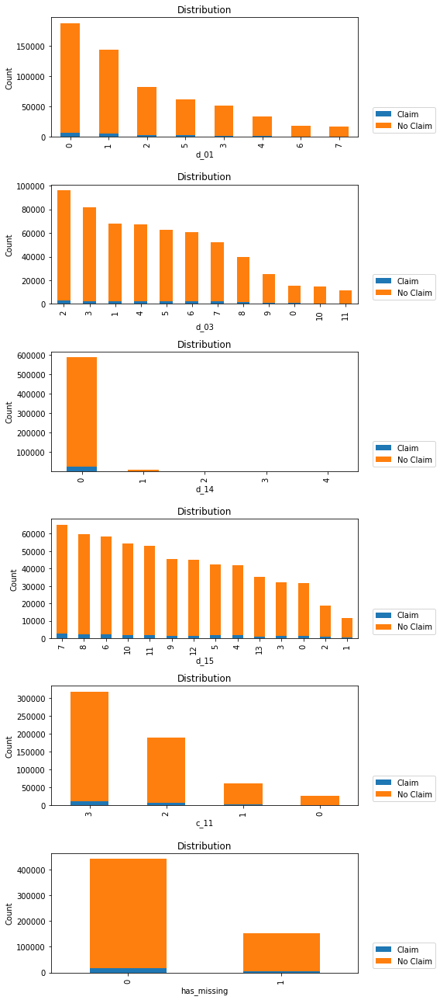

In [28]:
%config InlineBackend.figure_format = 'png'

#By not normalizing:
fig, axes = plt.subplots(ordCnt,1,figsize=(8,ordCnt*3))

for i,subplot in zip(range(ordCnt), axes.flatten()):
    
    crosstable = pd.crosstab(train_df[ordFeatures[i]], train_df['target'])#, normalize='index')
    crosstable.sort_values(by='No_Claim', ascending = False, inplace=True)
    
    crosstable.plot(kind='bar', stacked=True, ax=subplot)
    
    
    subplot.set_title('Distribution')
    subplot.set_xlabel(ordFeatures[i], size = 10)
    subplot.set_ylabel('Count', size = 10)
    #subplot.set_xticks(x)
    #x = ['Not Filed', 'Filed']
    #subplot.set_xticklabels(x, rotation='0')
    #subplot.legend()
    subplot.legend(bbox_to_anchor=(1.25,0.25), loc='upper right', borderaxespad=0, labels=['Claim', 'No Claim'])
    fig.tight_layout()

### Frequency of records based on ordinal variables:

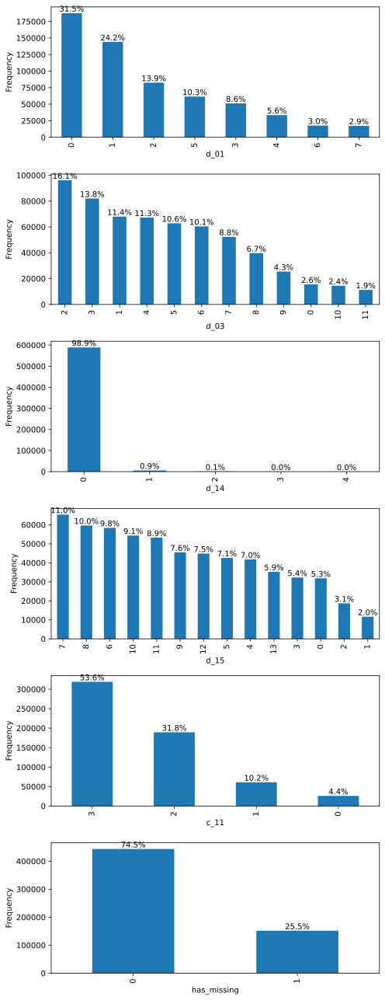

In [29]:
%config InlineBackend.figure_format = 'svg'

fig, axes = plt.subplots(ordCnt, 1, figsize=(7,3*ordCnt))

totalcnt = train_df.shape[0]
#for feat,subplot in zip(featLst, axes.flatten()):
for i, feat in enumerate(ordFeatures):
    train_df[ordFeatures[i]].value_counts().plot(kind='bar', ax = axes[i])    
    #axes[i].set_xticks(np.arange(cnt));
    #axes[i].set_xticklabels(xtickLst, rotation=90)
    axes[i].set_xlabel(feat)
    axes[i].set_ylabel('Frequency')
    
    
    for p in axes[i].patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        axes[i].annotate('{:.1f}%'.format(y*100/totalcnt), (x.mean(), y), ha='center', va='bottom')
        
    fig.tight_layout()
plt.savefig(imageDirectory + '\\ordinal_dist.png', dpi=140,  bbox_inches='tight')

- By **normalizing** the count in each level we will have:

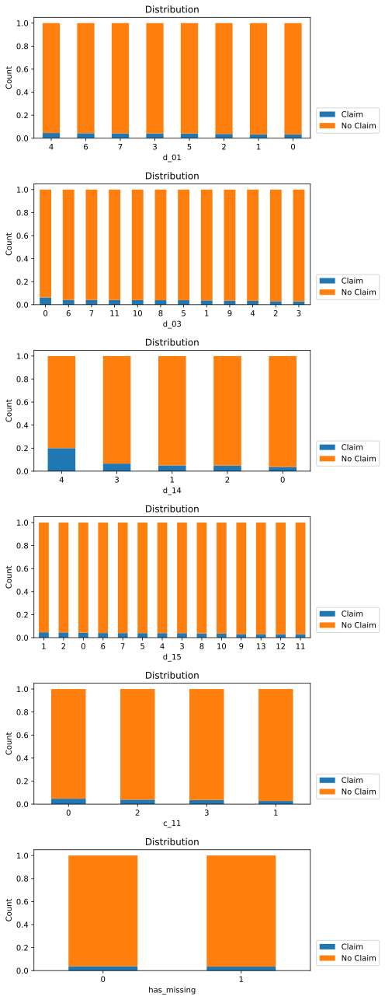

In [30]:
#By normalizing:
fig, axes = plt.subplots(ordCnt,1,figsize=(7,ordCnt*3))

for i,subplot in zip(range(ordCnt), axes.flatten()):
    
    crosstable = pd.crosstab(train_df[ordFeatures[i]], train_df['target'], normalize='index')
    crosstable.sort_values(by='Claim', ascending = False, inplace=True)
    
    crosstable.plot(kind='bar', stacked=True, ax=subplot)
    
    
    subplot.set_title('Distribution')
    subplot.set_xlabel(ordFeatures[i], size = 10)
    subplot.set_ylabel('Count', size = 10)
    #subplot.set_xticks(x)
    #x = ['Not Filed', 'Filed']
    xlabel = crosstable.index
    subplot.set_xticklabels(xlabel, rotation='0')
    #subplot.legend()
    subplot.legend(bbox_to_anchor=(1.25,0.25), loc='upper right', borderaxespad=0, labels=['Claim', 'No Claim'])
    fig.tight_layout()
plt.savefig(imageDirectory + '\\ordinal_normal.png', dpi=140,  bbox_inches='tight')

### Insight:
- Different levels of the following features show **no clear pattern**:
    - ps_ind_01,
    - ps_ind_15,
    - ps_car_11,
    - has_missing
<br><br>
- Features with **maximum possibility of filing** at specified level:
    - ps_ind_14: level 4
    - ps_ind_03: level 0
    
    
#### Let's visualize minority class when target=0

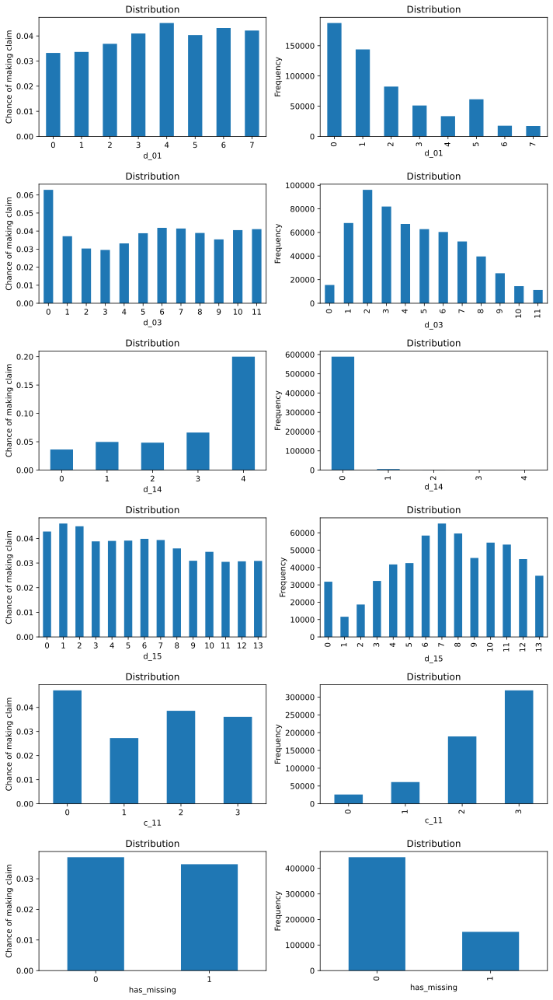

In [31]:
visualMinorityandFreq(train_df, ordFeatures, ordCnt, targetname='target', barNumber = False)
plt.savefig(imageDirectory + '\\ordinal_claim.png', dpi=140,  bbox_inches='tight')

#### Insight:
- More details based on features
    - **ps_ind_01**:
        - Frequency sequence: The lower the feature's value, the higher the frequency,
        - claiming chance: By increasing feature's value from 0 to 4, the claiming chance will increase, but beyond that it does not change a lot.
        - Highest claim chance is for: value of 4
        
    ***********************
    - **ps_ind_03**:
        - Frequency sequence: From 0 to 2, it increases, and beyond that it will decrease,
        - Maximum Frequency: value of 2,
        - Maximum chance of claim: value of 0        
        - minimum chance of claim: value of 2 and 3
        - claiming chance: Except for value of 0, they are quite comparable.
        
    ***********************        
    - **ps_ind_14**:
        - Frequency sequence: maximum:0, the rest show very low frequency.
        - Claiming chance: Except value of 4, they are quite comparable and increase by increasing of feature's value
        - Maximum chance of claim: value of 4
        
    ***********************                
    - **ps_ind_15**:
        - Frequency sequence: The frequency of this feature shows approximtely a normal distribution. 
        - Claiming chance: It is possible to make 3 groups:
               - Group1: 0, 1, 2
               - Group2: 3, 4, 5, 6, 7
               - Group3: 8, 9, 10, 11, 12, 13
               - Claiming chance: group1>group2>group3
        
    ***********************                
    - **ps_car_11**:
        - Frequency sequence: 3>2>1>0
        - Claiming chance: 0>2>3>1

***********************        
- For further analysis, it is worthful to know the ***real concept of the variables***.

### Visualizing of binary features:

In [32]:
# Calculation of vfeature variance:
cols = [x for x in binFeatures if x != 'target']
binfeatVariance = findVariance(train_df[cols])
binfeatVariance.head()

,feature,variance
4,d_10_bin,0.000373
7,d_13_bin,0.000947
5,d_11_bin,0.001689
6,d_12_bin,0.009350
9,d_17_bin,0.106421


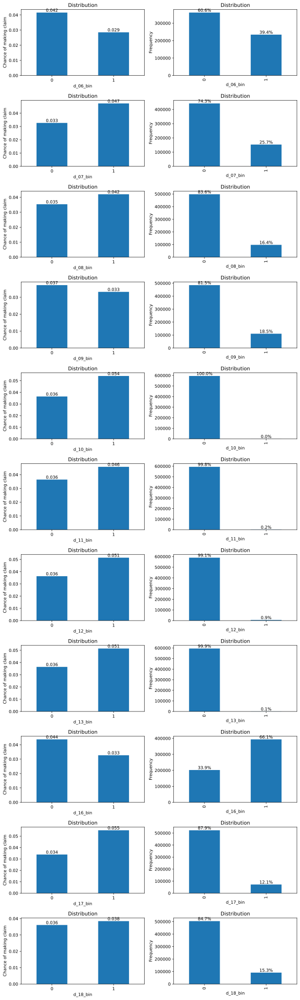

In [33]:
visualMinorityandFreq(train_df, binFeatures, binCnt, targetname='target', barNumber = True)
plt.savefig(imageDirectory + '\\binary_claim.png', dpi=140,  bbox_inches='tight')

### Insight:
We can devide the features into **two groups** as follow:

- **First Group**: Features where **value of 0** has **higher chance of claiming** than value of 1:
    - d_06_bin,
    - d_09_bin,
    - d_16_bin,

****************
- **Second Group**: Features where **value of 0** has **lower chance of claiming** than value of 1:
    - d_07_bin,
    - d_08_bin,
    - d_10_bin,
    - d_11_bin,
    - d_12_bin,
    - d_13_bin,
    - d_17_bin,
    - d_18_bin

In addition, we can also make another classification focused on the **relation between frequency and chance of claiming**:
<br>

- **Lower frequency is along with lower chance of claim:**
    - d_06_bin,
    - d_09_bin,
    
************************    
- **Lower frequency is along with higher chance of claim:**
    - d_07_bin,
    - d_08_bin,
    - d_10_bin,
    - d_11_bin,
    - d_12_bin,
    - d_13_bin,
    - d_16_bin,
    - d_17_bin,
    - d_18_bin

### Visualizing numerical features:

In [34]:
num_df.sort_values(by='uniqueCnt', ascending = False, inplace=True, ignore_index=True)
num_df

,feature,uniqueCnt
0,c_13,70416
1,r_03,65225
2,c_14,1031
3,c_12,183
4,r_02,19
5,c_15,15
6,r_01,10


#### Insight:
- According to the uniqueCnt column, the first four features considerably have more unique imput than others.
- Let's take a look at these four numerical features.

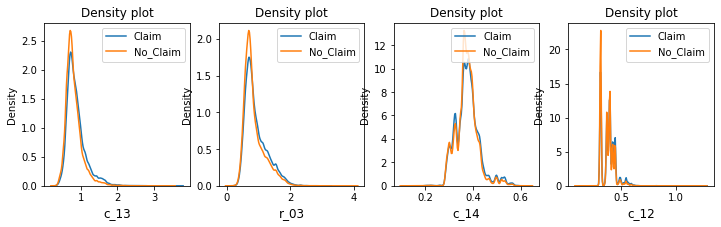

In [35]:
%config InlineBackend.figure_format = 'png'
featLst = num_df['feature'][:4].values

fig, axes = plt.subplots(1,4,figsize=(12,3))
for feat,subplot in zip(featLst, axes.flatten()):
    sns.kdeplot(train_df.loc[train_df['target']=='Claim', feat],bw=0.1, label='Claim', ax=subplot)
    sns.kdeplot(train_df.loc[train_df['target']=='No_Claim', feat],bw=0.1, label='No_Claim', ax=subplot);
    subplot.set_xlabel(feat, fontsize=12)
    subplot.set_title('Density plot')
    subplot.legend(loc='upper right')

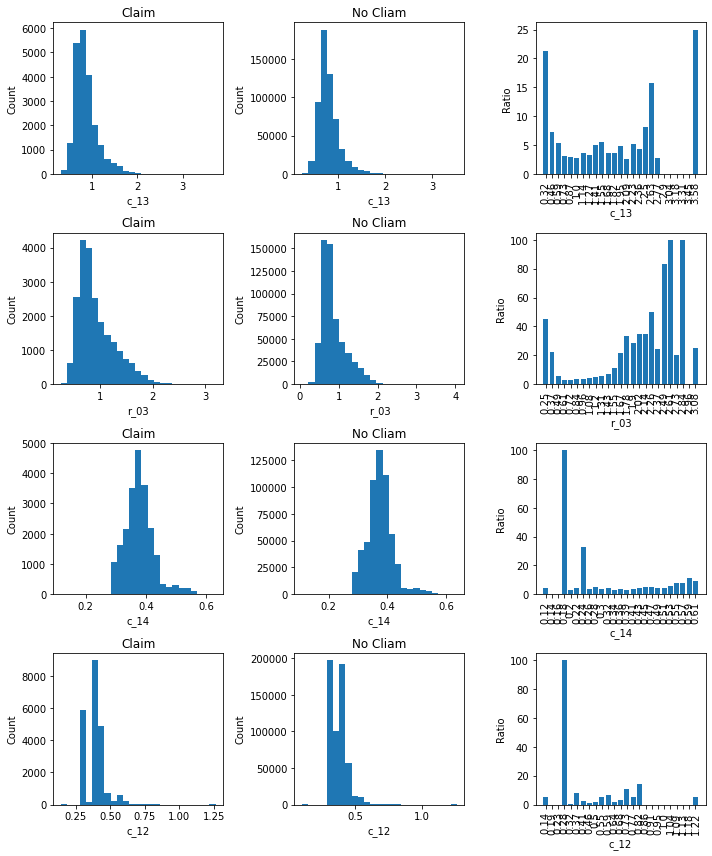

In [36]:
featCnt = len(featLst)
fig, axes = plt.subplots(featCnt, 3, figsize=(10,3*featCnt))

#for feat,subplot in zip(featLst, axes.flatten()):
for i, feat in enumerate(featLst):
    counts1, bins1, patches1 = axes[i, 0].hist(train_df.loc[train_df['target']=='Claim', feat],bins=25, label='Claim')
    axes[i,0].set_title('Claim')
    axes[i][0].set_xlabel(feat)
    axes[i][0].set_ylabel('Count')
    
    counts2, bins2, patches2 = axes[i, 1].hist(train_df.loc[train_df['target']=='No_Claim', feat],bins=25, label='No_Claim')
    axes[i,1].set_title('No Cliam')
    axes[i][1].set_xlabel(feat)
    axes[i][1].set_ylabel('Count')
    
    cntRatio = counts1*100/(counts1+counts2)
    cntRatio = np.where(np.isnan(cntRatio), 0, cntRatio)

    cnt = len(bins1) -1
    xmin = bins1[0]
    xmax = bins1[cnt]
    
    interval = (xmax - xmin)/cnt
    xtickLst = [round(xmin + i*interval, 2) for i in range(cnt)]
    

    axes[i][2].bar(range(cnt), cntRatio)
    axes[i][2].set_xticks(np.arange(cnt));
    axes[i][2].set_xticklabels(xtickLst, rotation=90)
    axes[i][2].set_xlabel(feat)
    axes[i][2].set_ylabel('Ratio')
    fig.tight_layout()

Insights
-------------------------------------------------------------
The general distribution of these four features over "Claim" and "No_Claim" are similar.

#### The rest of numerical features:
- Although they are numerical, the count of unique data entry are very limited. 
- Accordingly, maybe they can be treated as **pesudo ordinal variables**.

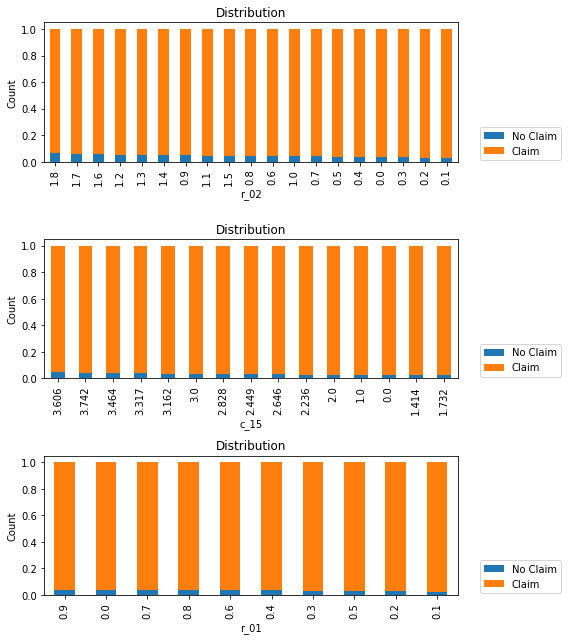

In [37]:
featLst = num_df['feature'][4:].values
featCnt = len(featLst)

#By normalizing:
fig, axes = plt.subplots(featCnt,1,figsize=(8,featCnt*3))

for i,subplot in zip(range(featCnt), axes.flatten()):
    
    crosstable = pd.crosstab(train_df[featLst[i]], train_df['target'], normalize='index')
    crosstable.sort_values(by='Claim', ascending = False, inplace=True)
    
    crosstable.plot(kind='bar', stacked=True, ax=subplot)
    xlabel = crosstable.index
    xlabel = np.round(xlabel,3)
    subplot.set_xticklabels(xlabel, rotation='90')
    
    subplot.set_title('Distribution')
    subplot.set_xlabel(featLst[i], size = 10)
    subplot.set_ylabel('Count', size = 10)
    #subplot.set_xticks(x)
    #x = ['Not Filed', 'Filed']
    #subplot.set_xticklabels(x, rotation='0')
    #subplot.legend()
    subplot.legend(bbox_to_anchor=(1.25,0.25), loc='upper right', borderaxespad=0, labels=['No Claim', 'Claim'])
    fig.tight_layout()

### Insight:
- Ratio of making claim at different level of these numerical features are similar.


### Let's focus on minority class of target

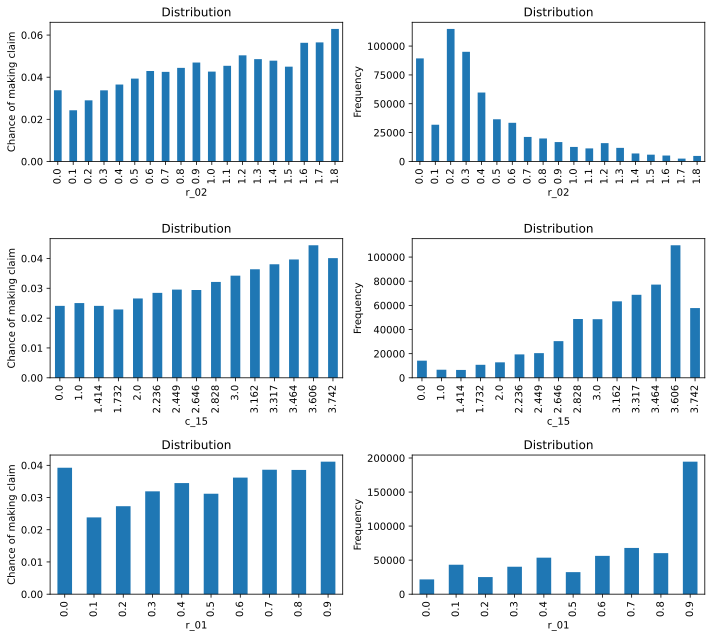

In [38]:
%config InlineBackend.figure_format = 'svg'

featLst = num_df['feature'][4:].values
featCnt = len(featLst)
visualMinorityandFreq(train_df, featLst, featCnt, targetname='target', barNumber = False, x_rotation=90)
plt.savefig(imageDirectory + '\\numerical_claim.png', dpi=140,  bbox_inches='tight')

Insights
-------------------------------------------------------------

*********************

#### r_02:
- Frequency: Except for Initial values, by increasing of value, the frequency will decrease.
- Except for Initial values, the chance of claiming shows a clear trend. 
<br>**By increasing of ps_reg_02 value, the chance of filing will increase**. 

**********************
#### c_15:
- Frequency: By increasing of value, the frequency will increase.
- Chance of Claiming: By increasing of value, the chance of filing will increase.

*********************
#### r_01:
- Frequency: Maximum of frequency is for the value of 9. The rest are approximatley comparable.
- Chance of Claiming: Except for the value of 0, by increasing of value, the chance of filing will increase.

### Correlation:

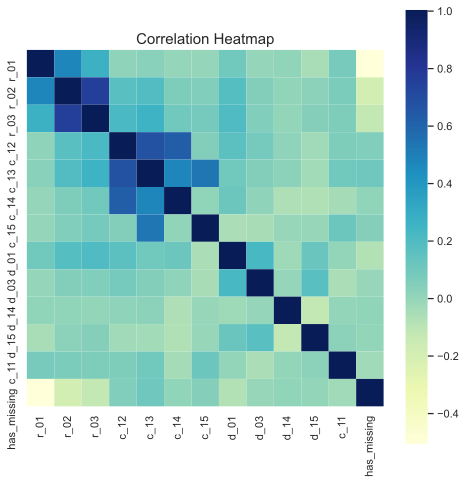

In [39]:
makeHeatmap(df=train_df, cols = numFeatures + ordFeatures, annot = False, line=False, width=8, height=8)

#### Correlated Features:
  - r_02 with r_03
  - c_12 with c_13
  - c_12 with c_14
  - c_13 with c_15

## Feature Engineering
### <font color='blue'>A) Interaction Features based on correlations</font>
The genral routine for making interaction features are as follow:
1) Making a list of non-Catergorical features
<br> 2) Calculating correlation of the list with target variable
<br> 3) Choose a threshold **(threshold1)** for the value of correllation with the target.
<br> 4) Choose a threshold **(threshold2)** for the value of correllation between two features.
<br> 5) Making a list of features where the features have correlation with target higher than **threshold1**.
<br> 6) Look for each two features from the list where they have correlation higher than  **threshold2**.

### <font color='blue'>B) Interactions for all region features:</font>
new Feature = df['r_01'] * df['r_02'] * df['r_03']

### <font color='blue'>C) For the top three correlated featuress with target:</font>
new Feature = Whether they are bigger than median?<br>
new Feature = Whether they are in central range of features or not 

In [40]:
# Renaming target data for calculation purposes:
train_df['target'].replace({'No_Claim':0,'Claim':1}, inplace=True)

In [41]:
cols = numFeatures + ordFeatures
cols.append('target')

corrRes = train_df[cols].corr()['target']
corrRes = abs(corrRes).sort_values(ascending=False)
corrRes

target         1.000000
c_13           0.053899
c_12           0.038800
r_03           0.036141
r_02           0.034800
c_15           0.027667
r_01           0.022888
d_15           0.021506
d_01           0.018570
c_14           0.013571
d_03           0.008360
d_14           0.007443
has_missing    0.005337
c_11           0.001221
Name: target, dtype: float64

In [42]:
threshold1 = 0.025
threshold2 = 0.2


corrLst = [x for x in corrRes.index if corrRes[x] > threshold1]
corrLst.remove('target')
interactionLst= []
for i, x in enumerate(corrLst):
    for j in range(i+1, len(corrLst)):
        y = corrLst[j]
        if train_df[x].corr(train_df[y])>threshold2:
            dicTemp = {'var1':x, 'var2': y}
            interactionLst.append(dicTemp)
interactionLst = pd.DataFrame(interactionLst)                
interactionLst

,var1,var2
0,c_13,c_12
1,c_13,r_03
2,c_13,c_15
3,c_12,r_03
4,r_03,r_02


In [43]:
print(train_df.shape)
for i in range(interactionLst.shape[0]):
    col1 = interactionLst['var1'][i]
    col2 = interactionLst['var2'][i]
    colName = '{}*{}'.format(col1, col2)
    train_df[colName] = train_df[col1]*train_df[col2]
    test_df[colName] = test_df[col1]*test_df[col2]
print(train_df.shape)    

(595212, 38)
(595212, 43)


### <font color='blue'>B) Interactions for all region features:</font>

In [44]:
train_df['allregion'] = train_df['r_01'] * train_df['r_02'] * train_df['r_03']
test_df['allregion'] = test_df['r_01'] * test_df['r_02'] * test_df['r_03']

### <font color='blue'>C) For the top three correlated featuress with target:</font>
new Feature = Whether they are bigger than median?<br>
new Feature = Whether they are in central range of features or not 

In [45]:
colLst = corrLst[:3]
medianLst = (train_df[colLst].median()).tolist() 
q1Lst = train_df[colLst].quantile(.25).values.tolist()
q3Lst = train_df[colLst].quantile(.75).values.tolist()


for i, col in enumerate(colLst):
    name1 = col + '_bigger_median'
    name2 = col + '_is_inside'
    
    train_df[name1] = (train_df.loc[:, colLst[i]]>medianLst[i]).astype(int)
    train_df[name2] = ((train_df.loc[:, colLst[i]]>q1Lst[i]) & (train_df.loc[:, colLst[i]]<q3Lst[i])).astype(int)

In [46]:
colLst = corrLst[:3]
medianLst = (test_df[colLst].median()).tolist() 
q1Lst = test_df[colLst].quantile(.25).values.tolist()
q3Lst = test_df[colLst].quantile(.75).values.tolist()


for i, col in enumerate(colLst):
    name1 = col + '_bigger_median'
    name2 = col + '_is_inside'
    
    test_df[name1] = (test_df.loc[:, colLst[i]]>medianLst[i]).astype(int)
    test_df[name2] = ((test_df.loc[:, colLst[i]]>q1Lst[i]) & (test_df.loc[:, colLst[i]]<q3Lst[i])).astype(int)

In [47]:
print(train_df.shape)
print(test_df.shape)

(595212, 50)
(892816, 49)


In [48]:
#Let us update the metadata and the categories' variables accordingly:
metadata = make_metadata(train_df)

catFeatures, catCnt, cat_df = make_typedf(train_df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(train_df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(train_df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(train_df, metadata, 'binary')


car_df = make_categorydf(train_df, metadata, 'car')
driver_df = make_categorydf(train_df, metadata, 'driver')
region_df = make_categorydf(train_df, metadata, 'region')
calc_df = make_categorydf(train_df, metadata, 'artificial')
car_df.head(5)

,feature,uniqueCnt
0,c_01_cat,13
1,c_02_cat,3
2,c_04_cat,7
3,c_06_cat,18
4,c_07_cat,3


In [49]:
num_car_Cols = [col for col in numFeatures if 'c_' in col]
num_reg_Cols = [col for col in numFeatures if 'r_' in col]
num_ind_Cols = [col for col in numFeatures if 'd_' in col]

print('Numerical features in different categories:')
print(num_car_Cols)
print(num_ind_Cols)
print(num_reg_Cols)


cat_car_Cols = [col for col in catFeatures if 'c_' in col]
cat_reg_Cols = [col for col in catFeatures if 'r_' in col]
cat_ind_Cols = [col for col in catFeatures if 'd_' in col]

print('\nCategorical features in different categories:')
print(cat_car_Cols)
print(cat_ind_Cols)
print(cat_reg_Cols)



ord_car_Cols = [col for col in ordFeatures if 'c_' in col]
ord_reg_Cols = [col for col in ordFeatures if 'r_' in col]
ord_ind_Cols = [col for col in ordFeatures if 'd_' in col]

print('\nOrdinal features in different categories:')
print(ord_car_Cols)
print(ord_ind_Cols)
print(ord_reg_Cols)

Numerical features in different categories:
['c_12', 'c_13', 'c_14', 'c_15', 'c_13*c_12', 'c_13*r_03', 'c_13*c_15', 'c_12*r_03']
[]
['r_01', 'r_02', 'r_03', 'c_13*r_03', 'c_12*r_03', 'r_03*r_02']

Categorical features in different categories:
['c_01_cat', 'c_02_cat', 'c_04_cat', 'c_06_cat', 'c_07_cat', 'c_08_cat', 'c_09_cat', 'c_10_cat', 'c_11_cat']
['d_02_cat', 'd_04_cat', 'd_05_cat']
[]

Ordinal features in different categories:
['c_11', 'c_13_bigger_median', 'c_13_is_inside', 'c_12_bigger_median', 'c_12_is_inside']
['d_01', 'd_03', 'd_14', 'd_15']
['c_13_bigger_median', 'c_12_bigger_median', 'r_03_bigger_median', 'r_03_is_inside']


### <font color='blue'>Question: What is the relation between car and region features?</font>
- We do not know the original concept of the features, however suppose the relation between car and region would be important for us.
- Under this assumption, we can plot the variation of car features over Region-based variable.
- It is convinient to apply **groupby and aggregation** function as follow:

In [50]:
selected = [col for col in cat_car_Cols if (car_df.loc[car_df['feature']==col , 'uniqueCnt']<10).values]
selected

['c_02_cat', 'c_04_cat', 'c_07_cat', 'c_08_cat', 'c_09_cat', 'c_10_cat']

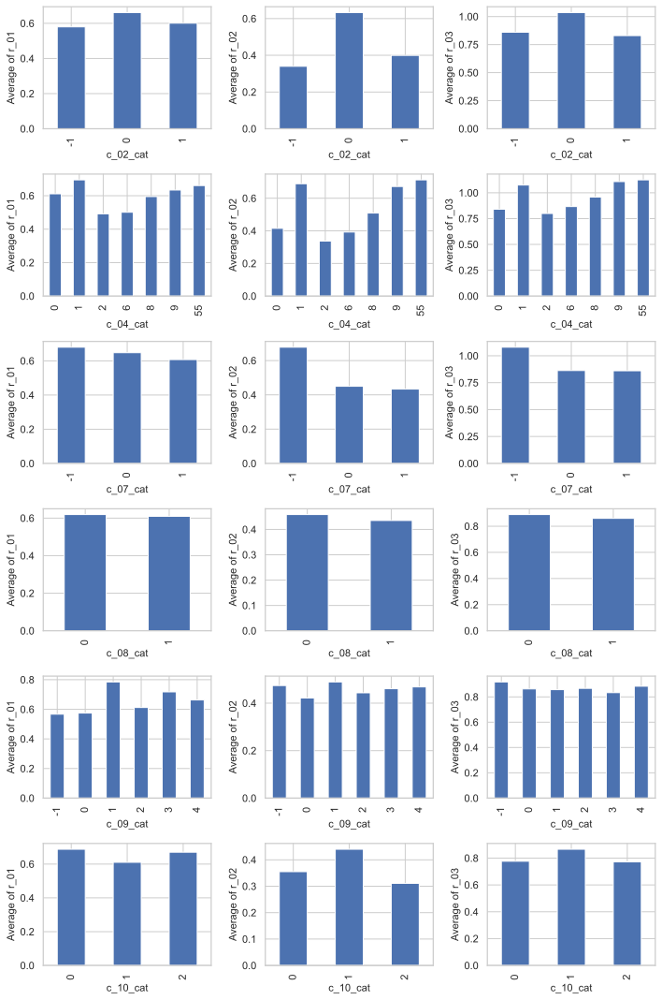

In [51]:
fig, axes = plt.subplots(len(selected), 3, figsize=(10,15))
for i, col in enumerate(selected):
    for j, region in enumerate(num_reg_Cols[0:3]):
        tabel = train_df[[region, col]].groupby(col).mean()    
        tabel.plot(kind='bar', stacked=True, ax=axes[i ,j])\
        
        axes[i, j].set_xlabel(col, size = 11)
        axes[i, j].set_ylabel('Average of {}'.format(region), size = 11)
        axes[i, j].get_legend().remove()
fig.tight_layout()
plt.savefig(imageDirectory + '\\car_region.png', dpi=140,  bbox_inches='tight')

### Insight and general trend:
- Although we do not the original concept of the variables, we can extract some insights from the above plots. For instance:
- **c_07_cat:**<br>
    - The missing values have high average in all three region features.
    - One can observe that the region average value have the sequence of: -1 > 0 > 1

### <font color='blue'>Question: How would be the relation between drivers and region?</font>
- Again, it is convinient to apply **groupby and aggregation** function as follow:

In [52]:
reg_Cols = ['r_01', 'r_02', 'r_03']

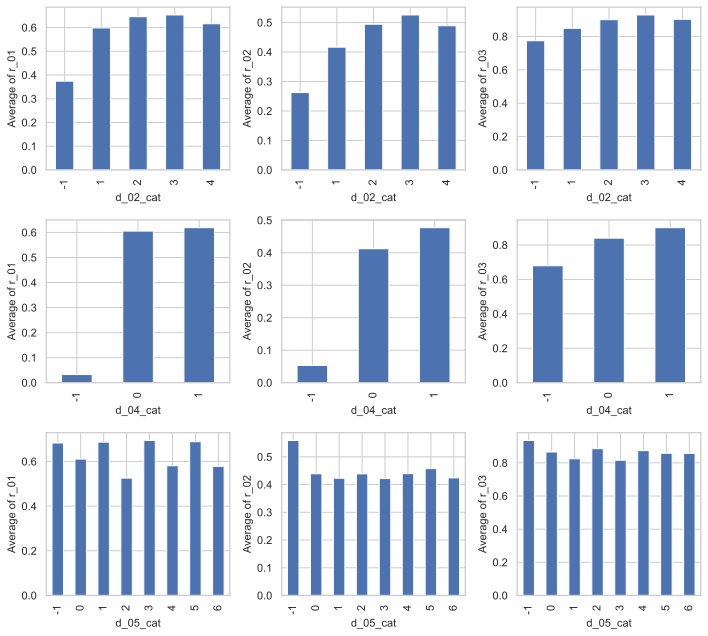

In [53]:
selected = [col for col in cat_ind_Cols if (driver_df.loc[driver_df['feature']==col , 'uniqueCnt']<10).values]
selected

fig, axes = plt.subplots(len(selected), 3, figsize=(10,3*len(selected)))
for i, col in enumerate(selected):
    for j, region in enumerate(reg_Cols):
        tabel = train_df[[region, col]].groupby(col).mean()    
        tabel.plot(kind='bar', stacked=True, ax=axes[i ,j])\
        
        axes[i, j].set_xlabel(col, size = 11)
        axes[i, j].set_ylabel('Average of {}'.format(region), size = 11)
        axes[i, j].get_legend().remove()
fig.tight_layout()
plt.savefig(imageDirectory + '\\drivers_region.png', dpi=140,  bbox_inches='tight')

### Insight:
- Although we do not the original concept of the variables, we can extract some insights from the above plots. For instance:
- **d_02_cat:**<br>
    - The missing values have low average in all of the three region features.
    - It is observed that average of region categories on d_02_cat have the sequence of: -1 < 1 < 2 < 3

### <font color='blue'>Outliers Analysis:</font>
- We can visualize the numerical variables using box-plot to check the distribution of variables and check the potential of outliers.
- But to determine if a value is outliers or not, we need to know the exact concept of variables. Since this is not available by the dataset provider, we just visualize the box plot.

In [54]:
# We will check the original numerical features where they have many unique values 
num_df

,feature,uniqueCnt
0,r_01,10
1,r_02,19
2,r_03,65225
3,c_12,183
4,c_13,70416
5,c_14,1031
6,c_15,15
7,c_13*c_12,92265
8,c_13*r_03,542101
9,c_13*c_15,89268


In [55]:
cols = num_df['feature'][2:6]

In [56]:
cnt = len(cols)
fig, axes = plt.subplots(cnt,1,figsize=(6,3 * cnt))

for i,col in enumerate(cols):
    sns.boxplot(x = col, data = train_df, orient = 'v', ax = axes[i]);

    axes[i].set_title('Boxplot of '+ col)
    #subplot.set_xlabel('x', size = 10)
    axes[i].set_ylabel(col, size = 10)
    #subplot.set_xticks(x)
    #x = ['Not Filed', 'Filed']
    #subplot.set_xticklabels(x, rotation='0')
    #subplot.legend()
    fig.tight_layout()
plt.savefig(imageDirectory + '\\box_plot.png', dpi=140,  bbox_inches='tight')

### Insight: 
Although for analysing the outlier status, we need the exact concept of each variables, from the box plot visualization two variables of "r_03" and "c_12" show extremum values which are far from other records in the dataset. It is likey that these two featurers have a kind of outliers. By the way we keep them since we are not sure about the concept behind the variables.

### Aquare of numerical features:

In [57]:
numFeatures

['r_01',
 'r_02',
 'r_03',
 'c_12',
 'c_13',
 'c_14',
 'c_15',
 'c_13*c_12',
 'c_13*r_03',
 'c_13*c_15',
 'c_12*r_03',
 'r_03*r_02',
 'allregion']

In [58]:
cols = numFeatures[:7]
temp_df = train_df[cols]

for col in cols:
    temp_df[col+'Sq'] = temp_df[col]*temp_df[col]
    #print(col+'square')
temp_df['target'] = train_df['target']
temp_df.head(2) 

corrTemp = temp_df.corr()['target']

lst1 = corrTemp.values[:7]
lst2 = corrTemp.values[7:14]
idLst =  corrTemp.index[:7]
corrRes = pd.DataFrame({'feat_Corr': lst1, 'featSq_Corr':lst2}, index = idLst)
corrRes

,feat_Corr,featSq_Corr
r_01,0.022888,0.023291
r_02,0.034800,0.032727
r_03,0.036141,0.033960
c_12,0.038800,0.038355
c_13,0.053899,0.051716
c_14,0.013571,0.015475
c_15,0.027667,0.029920


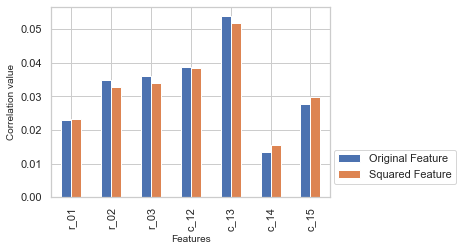

In [59]:
%config InlineBackend.figure_format = 'png'
fig, ax = plt.subplots(figsize=(5,3.5))
corrRes.plot(kind='bar', ax = ax);
ax.set_xlabel('Features', size = 10)
ax.set_ylabel('Correlation value', size = 10);
plt.xticks(rotation=90);

ax.legend(bbox_to_anchor=(1.45,0.25), loc='upper right', borderaxespad=0, labels=['Original Feature', 'Squared Feature']);

### Insight:
We can add three new features as sqaure features:
- r_01_Sq,
- c_14_Sq, 
- c_15_Sq 

In [60]:
train_df['r_01_Sq'] = train_df['r_01'] * train_df['r_01']
train_df['c_14_Sq'] = train_df['c_14'] * train_df['c_14']
train_df['c_15_Sq'] = train_df['c_15'] * train_df['c_15']

test_df['r_01_Sq'] = test_df['r_01'] * test_df['r_01']
test_df['c_14_Sq'] = test_df['c_14'] * test_df['c_14']
test_df['c_15_Sq'] = test_df['c_15'] * test_df['c_15']

### Encoding Categorical Features:
- Except for feature "c_11_cat", all categorical features have less than 20 unique data entry.
- Feature "c_11_cat" has 104 unique data entry, and for that it is preferable to apply target encoding to prevent size increasing of the data set.
- For the rest of categorical features, we can go ahead with one hot encoding.

In [61]:
#Let us update the metadata:
metadata = make_metadata(train_df)

catFeatures, catCnt, cat_df = make_typedf(train_df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(train_df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(train_df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(train_df, metadata, 'binary')

pd.DataFrame({'count' : metadata.groupby(['role', 'type'])['role'].size()}).reset_index()

,role,type,count
0,id,categorical,1
1,input,binary,11
2,input,categorical,12
3,input,numeric,16
4,input,ordinal,12
5,target,binary,1


In [62]:
# When we apply drop_first in get_dummies function, it ignores first category from each categorical variable:
temp_df = pd.DataFrame({'Feature1':['a', 'b', 'c'], 'Feature2':['a', 'b', 'c']})
pd.get_dummies(temp_df, drop_first=True)

,Feature1_b,Feature1_c,Feature2_b,Feature2_c
0,0,0,0,0
1,1,0,1,0
2,0,1,0,1


In [63]:
cols = [x for x in catFeatures if x != 'c_11_cat']
print('Before dummification we have {} variables in train'.format(train_df.shape[1]))
train_df = pd.get_dummies(train_df, columns=cols, drop_first=True)
print('After dummification we have {} variables in train'.format(train_df.shape[1]))

Before dummification we have 53 variables in train
After dummification we have 102 variables in train


In [64]:
print('Before dummification we have {} variables in train'.format(test_df.shape[1]))
test_df = pd.get_dummies(test_df, columns=cols, drop_first=True)
print('After dummification we have {} variables in train'.format(test_df.shape[1]))

Before dummification we have 52 variables in train
After dummification we have 101 variables in train


### Applying scaler

In [65]:
cols = numFeatures + ordFeatures[:5]

In [66]:
scaler = RobustScaler()
train_df[cols] = scaler.fit_transform(train_df[cols])
test_df[cols] = scaler.transform(test_df[cols])

In [67]:
# Spliting train_df into X and y. For X: we remove id and target

X = train_df.iloc[:, 2:]
y = train_df.iloc[:, 1].to_frame()
X_test_kaggle = test_df.iloc[:, 1:]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=41)

### Target-based encoding:
Using this approach let us to keep the dimension of the dataset constant.

In [68]:
from category_encoders.target_encoder import TargetEncoder
# Categorical features for target based encoding:
cols = ['c_11_cat']


encoder = TargetEncoder(cols=cols, return_df=True)
print('Before encoding we have {} features in dataset'.format(X_train.shape[1]))
X_train = encoder.fit_transform(X_train, y_train)
X_test = encoder.transform(X_test)
X_test_kaggle = encoder.transform(X_test_kaggle)
print('Before encoding we have {} features in dataset'.format(X_train.shape[1]))

Before encoding we have 100 features in dataset
Before encoding we have 100 features in dataset


In [69]:
imp_table, low_imp, zero_imp, cumulative_imp = feature_selection_RandomForset(X_train, y_train)

The original data has 100 features. By applying importance threshold of 0.100, we found:
0 features has been selected.
100 features has been removed.

Before feature selection: (416648, 100)
After feature selection: (416648, 0)


In [70]:
imp_table.head()

,feature,importance,normalized_importance,cumulative_importance
0,c_13*r_03,0.057822,0.057822,0.057822
1,r_03,0.056947,0.056947,0.114769
2,c_12*r_03,0.056844,0.056844,0.171613
3,c_13,0.055868,0.055868,0.227481
4,c_13*c_12,0.054980,0.054980,0.282461


### <font color='blue'>Insight from feature importance:</font>
- From top 5 important features, three of them are belong to the engineered features.

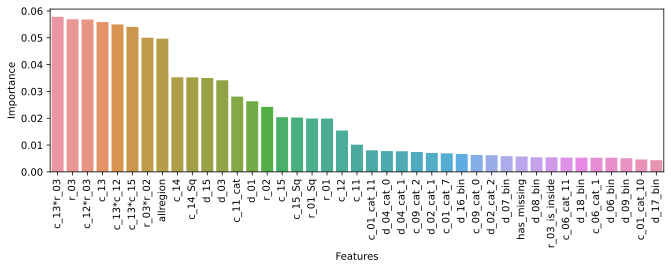

In [71]:
%config InlineBackend.figure_format = 'svg'
selected = imp_table.loc[:40, ['feature', 'importance']]
selected


fig, axes = plt.subplots(figsize=(11,3))
sns.barplot(x=selected['feature'], y=selected['importance'], ax = axes)
axes.set_xlabel('Features', size = 10)
axes.set_ylabel('Importance', size = 10);

plt.xticks(rotation=90);
plt.savefig(imageDirectory + '\\feature_importance.png', dpi=140,  bbox_inches='tight')

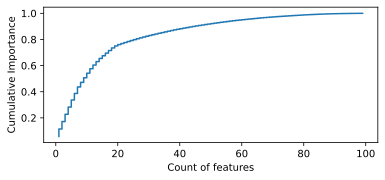

In [72]:
selected = imp_table.loc[imp_table['cumulative_importance']<1, :]
fig, axes = plt.subplots(figsize=(6,2.5))
#sns.lineplot(x=selected.index + 1, y=selected['cumulative_importance'], ax = axes)
plt.step(selected.index + 1, selected['cumulative_importance'])
axes.set_xlabel('Count of features', size = 10)
axes.set_ylabel('Cumulative Importance', size = 10);

plt.savefig(imageDirectory + '\\cumulative_importance.png', dpi=140,  bbox_inches='tight')

### Insight:
According to the feature importance result and the cumulative importance curve, we can decide to continue with different size of input dataset for model training. Of course it is a tradeoff between business metric score and the computational time. It is required to decide based on the business goal. In this project, we continue with considering a threshold of 0.99 cumulative importance.

In [76]:
selected_cols = imp_table.loc[imp_table['cumulative_importance']<0.99, 'feature'].values
print('Count of all features: {:d}'.format(imp_table.shape[0]))
print('Count of features, based on feature importance: {:d}'.format(len(selected_cols)))

Count of all features: 100
Count of features, based on feature importance: 82


### <font color=blue>Some points for saving dataset:</font>
The process which are done on the dataset:
1. We have applied scaler on numerical features.
2. We have applied onehotencoder to encod categorical variables.
3. But for the feature "c_11_cat" which has 104 unique value, target-based encoing is done.<br>
   To apply this encoder, first we split the dataset into the train and test dataset.
4. For modeling purposes, we must use the same test dataset due to the applied target encoding.<br>
   Otherwise the applied encoding will interfere with obtained business metric.

### Exporting dataset for future using:
We will save two forms of dataset.
1. Dataset with all features.
2. Dataset with selected important features.

### <font color=green> A) Saving dataset using full features</font> 

In [74]:
X_train.to_csv(dataDirectory + "\\X_train_full_feature.csv", index=False)
X_test.to_csv(dataDirectory + "\\X_test_full_feature.csv", index=False)
X_test_kaggle.to_csv(dataDirectory + "\\X_test_kaggle_full_feature.csv", index=False)
y_train.to_csv(dataDirectory + "\\y_train.csv", index=False)
y_test.to_csv(dataDirectory + "\\y_test.csv", index=False)

### <font color=green> B) Saving dataset using selected important features</font> 

In [77]:
X_train_imp_feature = X_train[selected_cols]
X_test_imp_feature = X_test[selected_cols]
X_test_kaggle_imp_feature = X_test_kaggle[selected_cols]

X_train_imp_feature.to_csv(dataDirectory + "\\X_train_imp_feature.csv", index=False)
X_test_imp_feature.to_csv(dataDirectory + "\\X_test_imp_feature.csv", index=False)
X_test_kaggle_imp_feature.to_csv(dataDirectory + "\\X_test_kaggle_imp_feature.csv", index=False)